**Name:** Johanna Barzola S.

**M6-Marketing Digital y Segmentación de Clientes CI-PBA**

# **Clasificación de Clientes de Tarjetas de Crédito a través de Algoritmos de Clustering**

El conjunto de datos de muestra resume el comportamiento de uso de alrededor de 9000 titulares activos de tarjetas de crédito durante los últimos 6 meses. El archivo está a nivel de cliente con 18 variables de comportamiento. A continuación se presenta el Diccionario de Datos del conjunto de datos de Tarjetas de Crédito:

| **Variable**               | **Descripción**                                                                 |
|----------------------------|---------------------------------------------------------------------------------|
| **CUST_ID**                | Identificación del titular de la tarjeta de crédito.                             |
| **BALANCE**                | Monto de saldo restante en la cuenta para realizar compras.                      |
| **BALANCE_FREQUENCY**      | Frecuencia con la que se actualiza el saldo (entre 0 y 1).                       |
| **PURCHASES**              | Monto de las compras realizadas desde la cuenta.                                 |
| **ONEOFF_PURCHASES**       | Monto máximo de compra realizado de una sola vez.                                |
| **INSTALLMENTS_PURCHASES** | Monto de compras realizadas en cuotas.                                           |
| **CASH_ADVANCE**           | Dinero en efectivo adelantado proporcionado al usuario.                          |
| **PURCHASES_FREQUENCY**    | Frecuencia con la que se realizan compras (entre 0 y 1).                         |
| **ONEOFFPURCHASESFREQUENCY**| Frecuencia con la que se realizan compras de una sola vez (entre 0 y 1).         |
| **PURCHASESINSTALLMENTSFREQUENCY**| Frecuencia con la que se realizan compras en cuotas (entre 0 y 1).         |
| **CASHADVANCEFREQUENCY**   | Frecuencia con la que se realiza el pago de adelantos en efectivo.               |
| **CASHADVANCETRX**         | Número de transacciones realizadas con "adelantos en efectivo".                  |
| **PURCHASES_TRX**          | Número de transacciones de compra realizadas.                                    |
| **CREDIT_LIMIT**           | Límite de crédito de la tarjeta para el usuario.                                 |
| **PAYMENTS**               | Monto de los pagos realizados por el usuario.                                    |
| **MINIMUM_PAYMENTS**       | Monto mínimo de pagos realizados por el usuario.                                 |
| **PRCFULLPAYMENT**         | Porcentaje del pago total realizado por el usuario.                              |
| **TENURE**                 | Tiempo de servicio de la tarjeta de crédito para el usuario.                     |

#1. Importar Librerías Necesarias

In [1]:
!pip install scikit-learn-extra

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 20.0 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram
import os
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering

#2. Cargar el Dataset


In [3]:
data = pd.read_csv('CC GENERAL.csv')

In [4]:
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


#3. Análisis Exploratorio de Datos

##3.1 Revisar información básica de los datos

In [5]:
data.shape

(8950, 18)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

##3.2 Visualización de la distribución de variables numéricas

In [7]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


###Histogramas

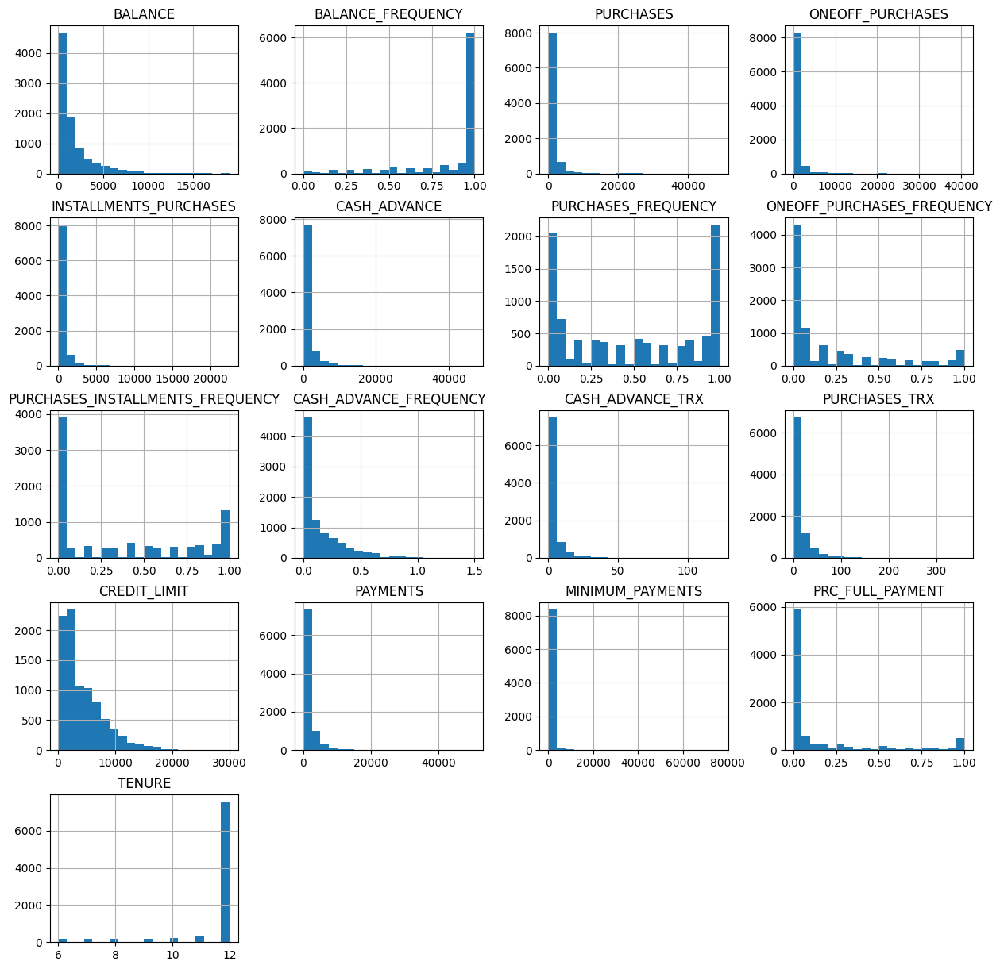

In [8]:
data.hist(bins=20, figsize=(15,15))
plt.show()

###Boxplots para cada variable numérica

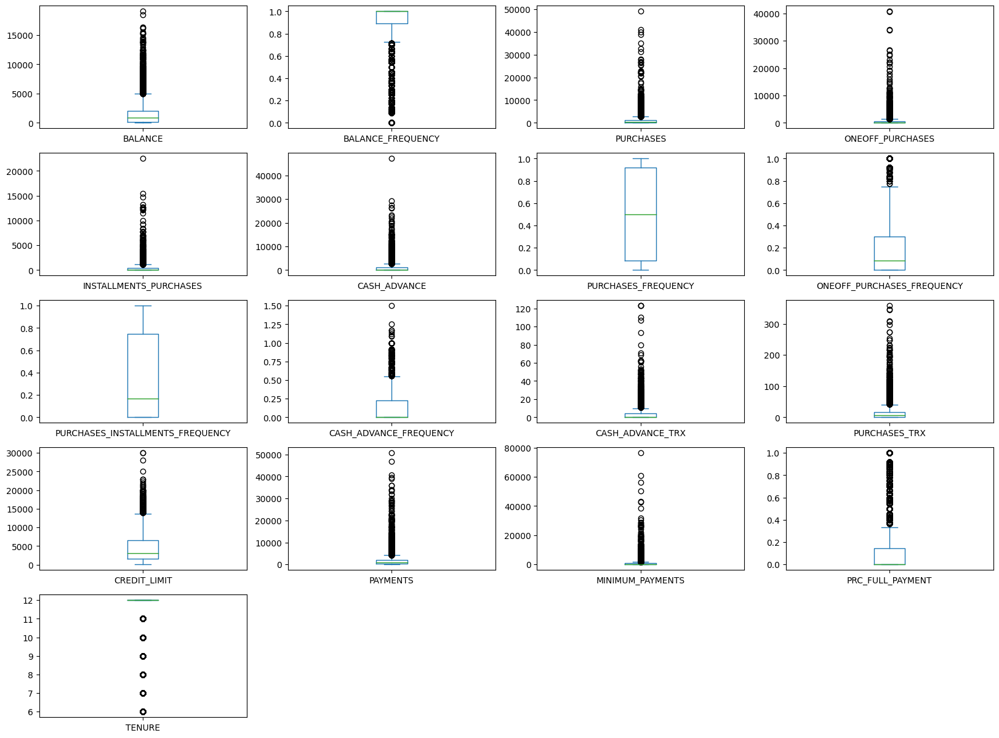

In [9]:

data.plot(kind='box', subplots=True, layout=(5,4), figsize=(20,15))
plt.show()

* Los gráficos analizados revelan que en las variables relacionadas con datos financieros o de tarjetas de crédito, la mayoría de los usuarios tiende a tener balances y montos de compra bajos, mientras que unos pocos presentan valores significativamente más altos.
* Se observa que la frecuencia de revisión de balances y compras es alta entre la mayoría, aunque algunas actividades, como adelantos en efectivo y compras a plazos, son menos comunes.
* Además, la mayoría de los usuarios tiene límites de crédito bajos y realiza pagos mínimos pequeños.
* En general, las distribuciones reflejan una concentración en la parte baja de las variables, con una cola superior que indica un pequeño grupo con valores elevados.

##3.3 Visualización de correlaciones entre variables

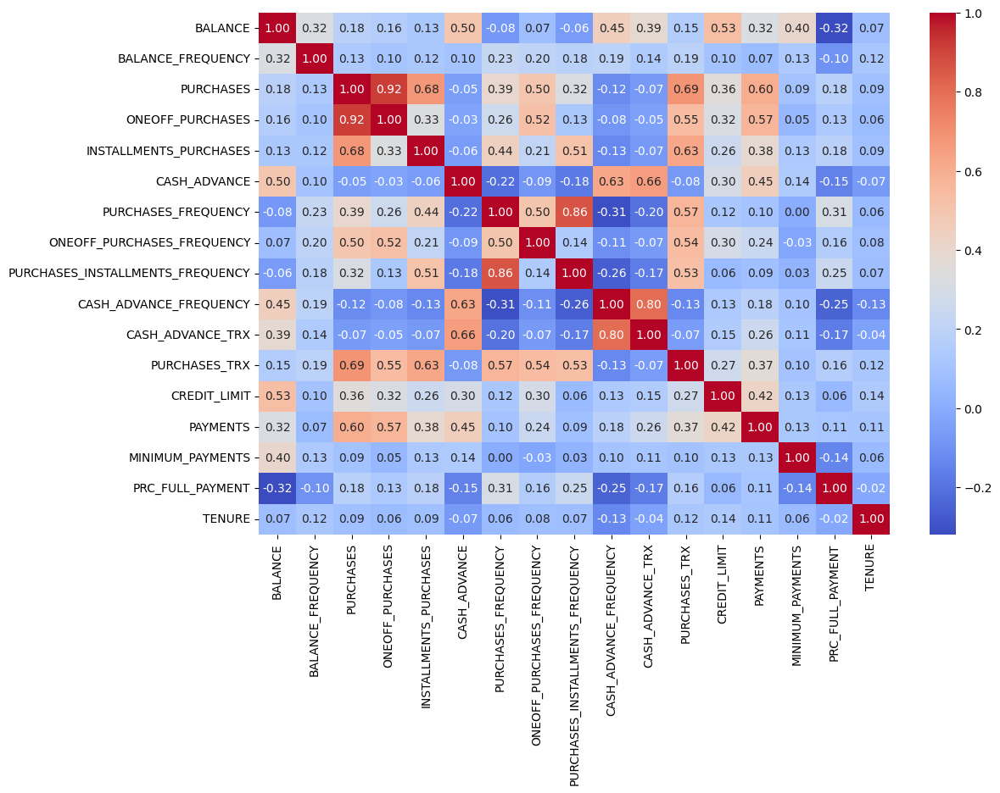

In [10]:
# Select only numerical features for correlation analysis
numerical_data = data.select_dtypes(include=['number'])

plt.figure(figsize=(12, 8))
sns.heatmap(numerical_data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

En la matriz de correlación, podemos observar qué variables están altamente correlacionadas entre sí. Una correlación alta (cercana a 1 o -1) entre dos variables indica que están fuertemente relacionadas, lo que puede llevar a problemas de multicolinealidad en los modelos, especialmente en regresiones.\
Para evitar estos problemas, podemos eliminar algunas variables redundantes.
####**Correlaciones más fuertes (positivas)**
* **PURCHASES y ONEOFF_PURCHASES (0.92)**\
Esto indica que una gran parte de las compras totales se realiza mediante compras no recurrentes, es decir, los clientes tienden a comprar en grandes cantidades en una sola transacción.
* **PURCHASES_INSTALLMENTS_FREQUENCY y PURCHASES_FREQUENCY (0.86):**\
Indica que los clientes que hacen compras a plazos también tienden a realizar compras con mayor regularidad.
* **PURCHASES y PURCHASES_TRX (0.69):**\
Esto sugiere que a mayor cantidad de transacciones, mayor será el valor total de las compras.
* **INSTALLMENTS_PURCHASES y PURCHASES (0.68):**\
Esto implica que un porcentaje considerable de las compras se realiza mediante pagos a plazos.
* **CASH_ADVANCE y CASH_ADVANCE_TRX (0.66):**\
Hay una correlación fuerte entre los adelantos en efectivo y el número de transacciones de adelantos en efectivo, lo que indica que los clientes que usan con frecuencia adelantos de efectivo tienden a hacerlo en cantidades mayores.
* **CREDIT_LIMIT y BALANCE (0.53):**\
Esto sugiere que los clientes con límites de crédito más altos tienden a tener saldos más elevados.
* **CASH_ADVANCE y BALANCE (0.50):**\
Indicar que los clientes que solicitan adelantos en efectivo suelen tener balances más altos.


####**Correlaciones fuertes (negativas)**
* **PRC_FULL_PAYMENT y BALANCE (-0.32):**\
Sugiere que los clientes que tienden a pagar el monto total adeudado tienen saldos más bajos.

* **PRC_FULL_PAYMENT y MINIMUM_PAYMENTS (-0.14):**\
Existe una correlación negativa entre el porcentaje de pagos completos y los pagos mínimos. Esto sugiere que los clientes que realizan el pago completo tienden a evitar los pagos mínimos.

#4. Limpieza de Datos


##4.1 Verificar si hay duplicados


In [11]:
print("\nNúmero de filas duplicadas:")
print(data.duplicated().sum())


Número de filas duplicadas:
0


In [12]:
# Eliminar filas duplicadas, manteniendo solo la primera ocurrencia
data = data.drop_duplicates()
# Verificar si hay duplicados después de eliminarlos
print("\nNúmero de filas duplicadas después de eliminarlas:")
print(data.duplicated().sum())


Número de filas duplicadas después de eliminarlas:
0


##4.2 Verificar y manejar valores nulos

In [13]:
# Verificar valores nulos
data.isnull().sum()

,0
CUST_ID,0
BALANCE,0
BALANCE_FREQUENCY,0
PURCHASES,0
ONEOFF_PURCHASES,0
INSTALLMENTS_PURCHASES,0
CASH_ADVANCE,0
PURCHASES_FREQUENCY,0
ONEOFF_PURCHASES_FREQUENCY,0
PURCHASES_INSTALLMENTS_FREQUENCY,0


Se reemplazarán los nulos con la mediana debido a que existe varios valores atípicos en las variables 'MINIMUM_PAYMENTS' y 'CREDIT_LIMIT'.

In [14]:
data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].median(), inplace=True)
data['CREDIT_LIMIT'].fillna(data['CREDIT_LIMIT'].median(), inplace=True)

<ipython-input-14-0e206164f358>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].median(), inplace=True)
<ipython-input-14-0e206164f358>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method

In [15]:
# Verificar que no haya nulos restantes
data.isnull().sum()

,0
CUST_ID,0
BALANCE,0
BALANCE_FREQUENCY,0
PURCHASES,0
ONEOFF_PURCHASES,0
INSTALLMENTS_PURCHASES,0
CASH_ADVANCE,0
PURCHASES_FREQUENCY,0
ONEOFF_PURCHASES_FREQUENCY,0
PURCHASES_INSTALLMENTS_FREQUENCY,0


In [16]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.282473,1733.143852,844.906767,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.646702,2895.063757,2332.792322,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,170.857654,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,788.713501,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


#5. Feature Engineering: Nuevas Características Avanzadas


##5.1 Crear características basadas en el comportamiento de pago
* **Frecuencia de pagos:** El total de pagos dividido entre la cantidad de compras puede indicar la frecuencia con la que el cliente paga sus deudas.
* **Porcentaje de pagos mínimos realizados:** Relaciona los pagos mínimos realizados con el total de pagos.

In [17]:
data['PAYMENT_FREQUENCY'] = data['PAYMENTS'] / (data['PURCHASES'] + 1e-10)
data['MINIMUM_PAYMENT_RATIO'] = data['MINIMUM_PAYMENTS'] / (data['PAYMENTS'] + 1e-10)

##5.2 Crear características basadas en el comportamiento de compra

* **Porcentaje de compras a crédito:** Proporción de las compras realizadas a crédito frente al total de compras.
* **Compras totales respecto al límite de crédito:** Proporción del uso del límite de crédito, importante para entender qué tan cerca está el cliente de su máximo disponible.

In [18]:
data['CREDIT_PURCHASES_RATIO'] = data['CREDIT_LIMIT'] / (data['PURCHASES'] + 1e-10)
data['CREDIT_UTILIZATION'] = data['BALANCE'] / (data['CREDIT_LIMIT'] + 1e-10)

##5.3 Características derivadas de transacciones

* **Frecuencia de transacciones:** Esta métrica ayuda a identificar la frecuencia con la que el cliente realiza compras.
* **Promedio de adelantos en efectivo por transacción:** Puede ayudar a identificar clientes que dependen mucho de los adelantos de efectivo.

In [19]:
data['TRANSACTION_FREQUENCY'] = data['PURCHASES_TRX'] / (data['CREDIT_LIMIT'] + 1e-10)
data['AVG_CASH_ADVANCE_AMOUNT'] = data['CASH_ADVANCE'] / (data['CASH_ADVANCE_TRX'] + 1e-10)


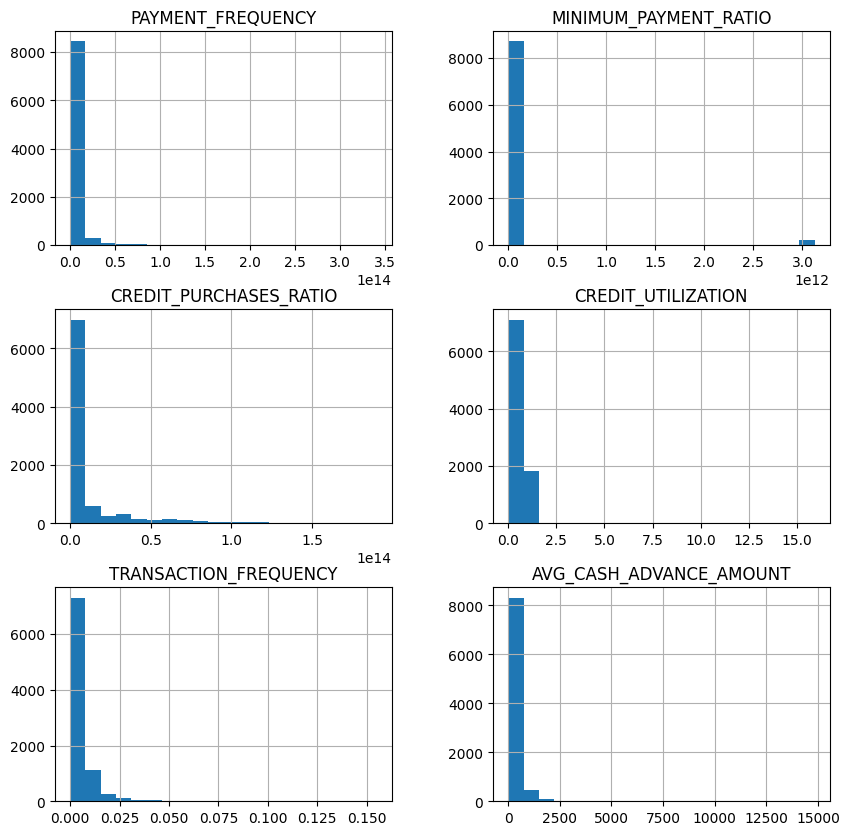

In [20]:
# Select the desired columns
selected_data = data[['PAYMENT_FREQUENCY',
 'MINIMUM_PAYMENT_RATIO',
 'CREDIT_PURCHASES_RATIO',
 'CREDIT_UTILIZATION','TRANSACTION_FREQUENCY',
 'AVG_CASH_ADVANCE_AMOUNT']]

# Create histograms
selected_data.hist(bins=20, figsize=(10, 10))
plt.show()

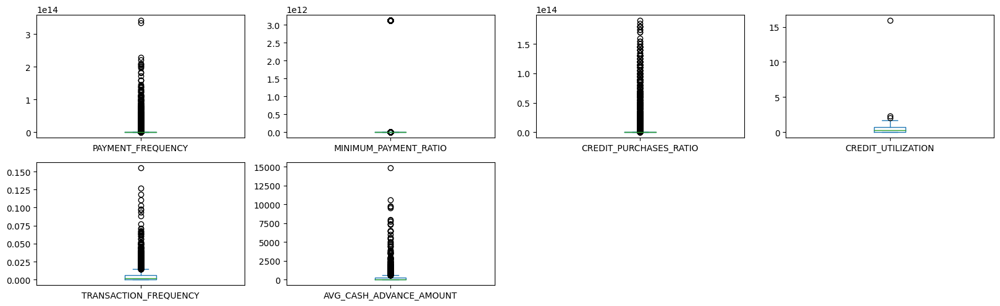

In [21]:
# Create boxplots
selected_data.plot(kind='box', subplots=True, layout=(5, 4), figsize=(20, 15))
plt.show()

#6. Encoding


* El paso de encoding generalmente se refiere a la transformación de variables categóricas en un formato numérico que los modelos de machine learning pueden interpretar.
* Sin embargo, este dataset solo tienes variables numéricas, el paso de encoding no sería necesario.
* El encoding es crucial cuando trabajas con variables categóricas, como texto o etiquetas, pero si todas las columnas del dataset ya están en formato numérico, entonces el paso se omite.

#7. Escalado de Datos
##7.1 Escalar variables numéricas para que los modelos no sean sensibles a las magnitudes

Este código tiene el propósito de escalar los datos numéricos en el dataset, normalizándolos para que tengan una distribución con media cero y desviación estándar uno. Esto es comúnmente necesario en muchos algoritmos de machine learning que son sensibles a la escala de los datos, como la regresión lineal, SVM, o K-means.

In [22]:
scaler = StandardScaler()
# Excluir 'CUST_ID' si está presente ya que es categórico
data_scaled = scaler.fit_transform(data.drop(['CUST_ID'], axis=1, errors='ignore'))

In [23]:
# Revisar cómo lucen los datos escalados
data_scaled = pd.DataFrame(data_scaled, columns=data.columns.drop(['CUST_ID'], errors='ignore'))
data_scaled.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,PAYMENT_FREQUENCY,MINIMUM_PAYMENT_RATIO,CREDIT_PURCHASES_RATIO,CREDIT_UTILIZATION,TRANSACTION_FREQUENCY,AVG_CASH_ADVANCE_AMOUNT
0,-0.731989,-0.249434,-0.424900,-0.356934,-0.349079,-0.466786,-0.806490,-0.678661,-0.707313,-0.675349,...,-0.528979,-0.302400,-0.525551,0.36068,-0.256536,-0.165996,-0.399923,-0.892951,-0.330278,-0.390021
1,0.786961,0.134325,-0.469552,-0.356934,-0.454576,2.605605,-1.221758,-0.678661,-0.916995,0.573963,...,0.818642,0.097500,0.234227,0.36068,2.531434,-0.165996,2.642499,0.176063,-0.592764,2.617185
2,0.447135,0.518084,-0.107668,0.108889,-0.454576,-0.466786,1.269843,2.673451,-0.916995,-0.675349,...,-0.383805,-0.093293,-0.525551,0.36068,-0.256536,-0.165996,-0.399923,-0.144206,-0.382775,-0.390021
3,0.049099,-1.016953,0.232058,0.546189,-0.454576,-0.368653,-1.014125,-0.399319,-0.916995,-0.258913,...,-0.598688,-0.228307,-0.525551,0.36068,-0.256536,6.024257,-0.399923,-0.427665,-0.575265,-0.005820
4,-0.358775,0.518084,-0.462063,-0.347294,-0.454576,-0.466786,-1.014125,-0.399319,-0.916995,-0.675349,...,-0.364368,-0.257266,-0.525551,0.36068,-0.256536,-0.165996,-0.399923,0.750693,-0.483394,-0.390021


####**Eliminar variables:**
* Eliminar **'PURCHASES', 'PURCHASES_FREQUENCY', 'CASH_ADVANCE_TRX'**.


In [24]:
data_scaled = data_scaled.drop(['PURCHASES','PURCHASES_FREQUENCY','CASH_ADVANCE_TRX'], axis=1)

#8. Entrenamiento de Modelos

##8.1 K-means Clustering
Elbow Method para encontrar el número óptimo de clusters

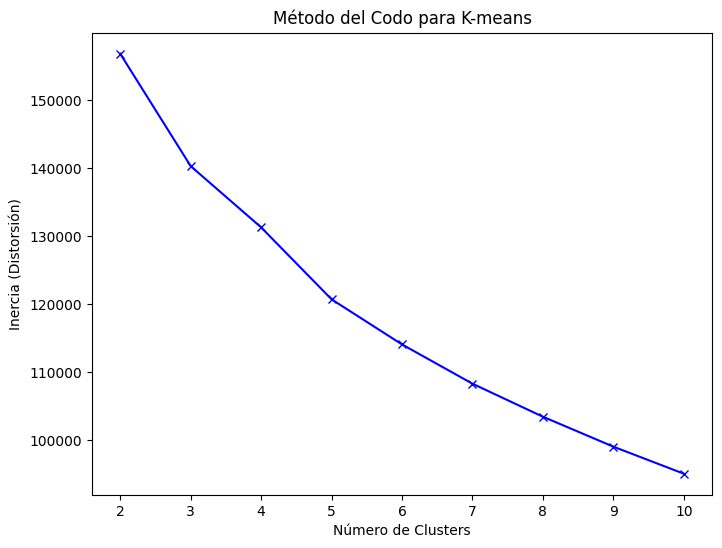

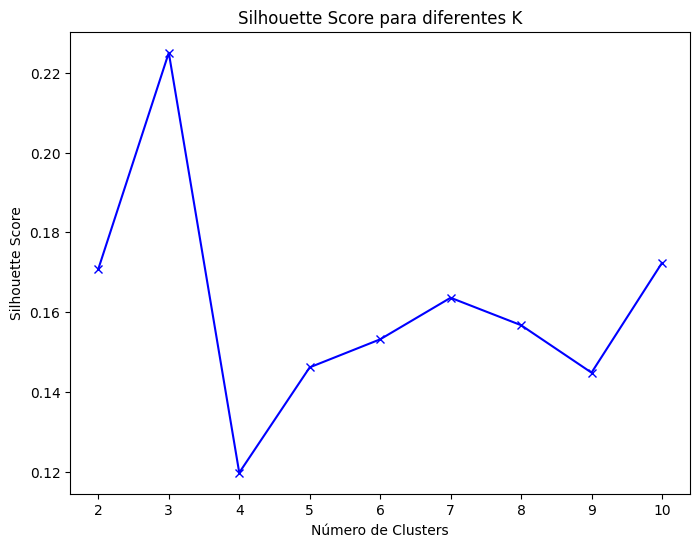

In [25]:
# Lista para almacenar distorsión (inercia) e índices de Silhouette
distortions = []
silhouette_scores = []
K = range(2, 11)  # Rango de número de clusters

# Cálculo de distorsión e índice de Silhouette para cada K
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_scaled)
    distortions.append(kmeans.inertia_)

    # Calcular silhouette score solo si hay más de un cluster
    silhouette_scores.append(silhouette_score(data_scaled, kmeans.labels_))

# Gráfico del Método del Codo (inercia/distorsión)
plt.figure(figsize=(8, 6))
plt.plot(K, distortions, 'bx-')
plt.xlabel('Número de Clusters')
plt.ylabel('Inercia (Distorsión)')
plt.title('Método del Codo para K-means')
plt.show()

# Gráfico del Silhouette Score
plt.figure(figsize=(8, 6))
plt.plot(K, silhouette_scores, 'bx-')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score para diferentes K')
plt.show()

Entrenar el modelo K-means con el número óptimo de clusters

In [26]:
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(data_scaled)
data['KMeans_Cluster'] = kmeans.labels_

# Evaluar el modelo K-means con el Silhouette Score
silhouette_kmeans = silhouette_score(data_scaled, kmeans.labels_)
print(f'Silhouette Score para K-means: {silhouette_kmeans:.3f}')


Silhouette Score para K-means: 0.225


##8.2 DBSCAN

In [27]:
param_grid = {
    'eps': [0.1, 0.2, 0.3, 0.5, 0.7],  # Distancia de radio
    'min_samples': [3, 5, 10]  # Número mínimo de puntos para formar un cluster
}

# Variable para almacenar los mejores resultados
best_score = -1
best_params = {}

# Búsqueda manual (Grid Search)
for eps in param_grid['eps']:
    for min_samples in param_grid['min_samples']:
        # Definir el modelo con los parámetros actuales
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)

        # Ajustar el modelo
        labels = dbscan.fit_predict(data_scaled)

        # Verificar que haya clusters generados, ya que DBSCAN puede generar ruido (label -1)
        if len(set(labels)) > 1:  # Necesitamos al menos 2 clusters para calcular el Silhouette Score
            # Evaluar el modelo con Silhouette Score
            score = silhouette_score(data_scaled, labels)

            # Guardar si es el mejor score
            if score > best_score:
                best_score = score
                best_params = {
                    'eps': eps,
                    'min_samples': min_samples
                }

# Imprimir los mejores parámetros y el mejor score
print(f"Mejores Parámetros: {best_params}")
print(f"Mejor Silhouette Score: {best_score:.4f}")


Mejores Parámetros: {'eps': 0.1, 'min_samples': 5}
Mejor Silhouette Score: -0.2461


####**Métricas de evaluación:**
Después de calcular todas las métricas, compara los resultados entre los modelos.
* **Silhouette Score:** Idealmente, selecciona el modelo con el mayor valor
* **Inercia:** Para KMeans y KMedoids, selecciona el modelo con el valor más bajo de inercia.
* **Davies-Bouldin Index:** El valor más bajo es mejor.
* **Calinski-Harabasz Score:** El valor más alto es mejor.

####Recopilar todas las métricas:



In [28]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Inicializar los modelos
kmeans = KMeans(random_state=42, n_clusters=3)
kmedoids = KMedoids(random_state=42, n_clusters=3)
dbscan = DBSCAN(eps=0.1, min_samples=5)
agglomerative = AgglomerativeClustering(n_clusters=3)

# Entrenar y predecir clusters
data['KMeans_Cluster'] = kmeans.fit_predict(data_scaled)
data['KMedoids_Cluster'] = kmedoids.fit_predict(data_scaled)
data['DBSCAN_Cluster'] = dbscan.fit_predict(data_scaled)
data['Agglomerative_Cluster'] = agglomerative.fit_predict(data_scaled)

# Calcular las métricas
metrics = {
    'Model': ['KMeans', 'KMedoids', 'DBSCAN', 'Agglomerative'],
    'Silhouette Score': [
        silhouette_score(data_scaled, data['KMeans_Cluster']),
        silhouette_score(data_scaled, data['KMedoids_Cluster']),
        silhouette_score(data_scaled, data['DBSCAN_Cluster']),
        silhouette_score(data_scaled, data['Agglomerative_Cluster'])
    ],
    'Davies-Bouldin Index': [
        davies_bouldin_score(data_scaled, data['KMeans_Cluster']),
        davies_bouldin_score(data_scaled, data['KMedoids_Cluster']),
        davies_bouldin_score(data_scaled, data['DBSCAN_Cluster']),
        davies_bouldin_score(data_scaled, data['Agglomerative_Cluster'])
    ],
    'Calinski-Harabasz Score': [
        calinski_harabasz_score(data_scaled, data['KMeans_Cluster']),
        calinski_harabasz_score(data_scaled, data['KMedoids_Cluster']),
        calinski_harabasz_score(data_scaled, data['DBSCAN_Cluster']),
        calinski_harabasz_score(data_scaled, data['Agglomerative_Cluster'])
    ]
}

df_metrics = pd.DataFrame(metrics)
print(df_metrics)


           Model  Silhouette Score  Davies-Bouldin Index  \
0         KMeans          0.225022              1.819900   
1       KMedoids          0.128956              2.231599   
2         DBSCAN         -0.246084              1.551626   
3  Agglomerative          0.119523              2.242282   

   Calinski-Harabasz Score  
0              1234.361188  
1               985.281097  
2                 3.295000  
3               855.781810  


**Inercia (SSE - Suma de errores al cuadrado):**
* Solo se aplica a métodos como KMeans o KMedoids.
* Mide la suma de las distancias al cuadrado entre los puntos de datos y sus centroides.
* Una inercia más baja generalmente indica una mejor agrupación.

In [29]:
print("Inercia de KMeans:", kmeans.inertia_)
print("Inercia de KMedoids:", kmedoids.inertia_)

Inercia de KMeans: 140290.14007214876
Inercia de KMedoids: 30347.28907078169


##8.2 El mejor modelo

**Conclusión:**

Basándonos en estas métricas:
* **KMeans** tiene el mejor Silhouette Score y el mejor Calinski-Harabasz Score, lo que sugiere que forma los clusters más compactos y bien separados, aunque no necesariamente con la mayor separación inter-cluster según el Davies-Bouldin Index.
* **DBSCAN** tiene el mejor Davies-Bouldin Index, pero su desempeño en las otras métricas es significativamente inferior.
* En resumen, el mejor modelo en general, considerando las tres métricas, parece ser **KMeans**.

In [30]:
best_model = KMeans(random_state=42,n_clusters=3)

In [31]:
best_model.fit(data_scaled)

KMeans(n_clusters=3, random_state=42)

#9. Interpretación de los Resultados
##9.1 Visualización de los clusters creados

In [32]:
numerical_features = data_scaled.select_dtypes(include=np.number).columns.tolist()
numerical_features

['BALANCE',
 'BALANCE_FREQUENCY',
 'ONEOFF_PURCHASES',
 'INSTALLMENTS_PURCHASES',
 'CASH_ADVANCE',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
 'PURCHASES_TRX',
 'CREDIT_LIMIT',
 'PAYMENTS',
 'MINIMUM_PAYMENTS',
 'PRC_FULL_PAYMENT',
 'TENURE',
 'PAYMENT_FREQUENCY',
 'MINIMUM_PAYMENT_RATIO',
 'CREDIT_PURCHASES_RATIO',
 'CREDIT_UTILIZATION',
 'TRANSACTION_FREQUENCY',
 'AVG_CASH_ADVANCE_AMOUNT']

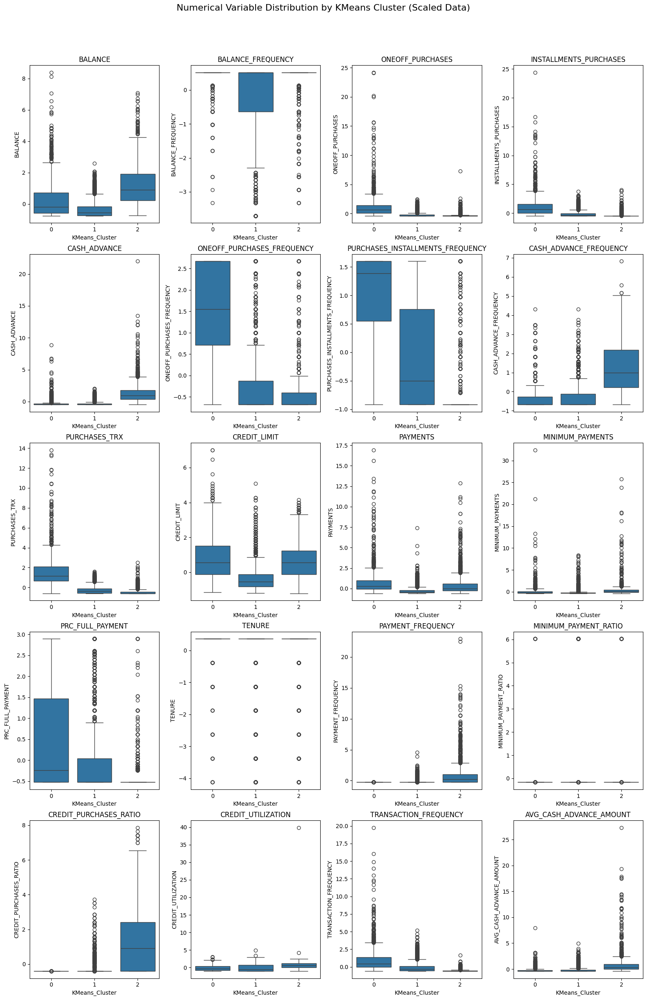

In [33]:
# Definir las columnas de interés en el DataFrame escalado
scaled_cols = numerical_features

# Asignar las etiquetas de clúster al DataFrame data_scaled
data_scaled['KMeans_Cluster'] = best_model.labels_  # Agregar la columna con las etiquetas de clúster

# Verificar si las columnas están presentes en el DataFrame data_scaled
scaled_cols = [col for col in scaled_cols if col in data_scaled.columns]

# Determinar el número de columnas y filas
n_cols = 4  # Número máximo de columnas
n_rows = int(np.ceil(len(scaled_cols) / n_cols))  # Calcular el número de filas necesario

# Crear subgráficas
fig, axs = plt.subplots(n_rows, n_cols, figsize=(16, 5 * n_rows))  # Ajustar el tamaño de la figura

# Aplanar el arreglo de ejes para facilitar la iteración
axs = axs.flatten()

# Iterar sobre las columnas para crear boxplots
for i in range(len(scaled_cols)):
    sns.boxplot(data=data_scaled, x='KMeans_Cluster', y=scaled_cols[i], ax=axs[i])
    axs[i].set_title(f'{scaled_cols[i]}')  # Añadir título a cada gráfico

# Ocultar los ejes no utilizados si hay menos de 4 columnas en la última fila
for j in range(len(scaled_cols), len(axs)):
    axs[j].axis('off')

# Ajustar el título general
fig.suptitle('Numerical Variable Distribution by KMeans Cluster (Scaled Data)', fontsize=16)

# Ajustar diseño y espaciado
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Ajustar el espacio del título general
plt.show()


"""
Los principales insights que se pueden obtener del gráfico de distribución de variables numéricas por cada cluster generado mediante K-means son los siguientes:

1. BALANCE: El Cluster 0 tiene un balance generalmente bajo en comparación con el Cluster 1, que muestra una mayor variabilidad y balances más altos. El Cluster 2 tiene balances intermedios. Esto indica que los clientes en el Cluster 1 podrían ser aquellos con un uso más intensivo de sus tarjetas.

2. BALANCE_FREQUENCY: Los tres clusters muestran una distribución muy similar, con una alta frecuencia de mantenimiento de balances. Esto sugiere que todos los grupos tienen un comportamiento relativamente consistente en términos de la frecuencia con que mantienen sus balances.

3. ONEOFF_PURCHASES: El Cluster 1 presenta un mayor volumen de compras únicas (one-off), mientras que los Clusters 0 y 2 tienen valores mucho menores. Esto podría significar que los clientes en el Cluster 1 tienden a realizar compras grandes y puntuales.

4. INSTALLMENTS_PURCHASES: El Cluster 1 destaca por tener clientes con un mayor volumen de compras a plazos en comparación con los otros clusters, lo que podría implicar que este grupo aprovecha las facilidades de pago a plazos.

5. CASH_ADVANCE: Los adelantos en efectivo son significativamente más comunes en el Cluster 2 en comparación con los otros dos clusters, lo que podría sugerir que estos clientes recurren más frecuentemente a esta opción de financiamiento.

6. CREDIT_LIMIT: El Cluster 1 tiene un límite de crédito más alto en promedio que los otros clusters, lo que sugiere que los clientes en este grupo son percibidos como menos riesgosos o más solventes por la institución financiera.

7. MINIMUM_PAYMENTS: Los pagos mínimos son mayores en el Cluster 1, mientras que el Cluster 0 tiene los pagos mínimos más bajos. Esto puede indicar que los clientes del Cluster 1 tienen una deuda mayor, pero también hacen pagos más significativos.

8. PRC_FULL_PAYMENT: Los clientes del Cluster 1 tienen una mayor probabilidad de hacer pagos completos de sus balances, lo que puede sugerir un manejo financiero más saludable en este grupo en comparación con los otros.

9. CREDIT_UTILIZATION: El Cluster 1 muestra una mayor utilización de crédito en comparación con los otros clusters, lo que refuerza la idea de que este grupo está haciendo un uso más intensivo de sus tarjetas de crédito.

10. TRANSACTION_FREQUENCY: Los clientes del Cluster 1 parecen tener una mayor frecuencia de transacciones, lo que refuerza el uso activo de sus tarjetas, mientras que el Cluster 0 tiene la menor frecuencia.

11. AVG_CASH_ADVANCE_AMOUNT: El Cluster 2 destaca con un mayor monto promedio en los adelantos en efectivo, lo que podría implicar que este grupo depende más de los avances en efectivo como fuente de liquidez.

- El **Cluster 1** parece representar a clientes con alto uso de crédito, balances altos, pagos completos y frecuentes compras únicas, lo que sugiere que son clientes con alto poder adquisitivo y probablemente bajo riesgo.
- El **Cluster 2** está más asociado con un uso frecuente de adelantos en efectivo y podría representar un segmento de clientes con mayores necesidades de liquidez.
- El **Cluster 0** podría representar a usuarios con un uso más moderado o conservador de las tarjetas de crédito, con menores balances y menos transacciones en general.

##9.2 Análisis de las características más discriminantes entre clusters

In [34]:
from itertools import combinations

# Generar todas las combinaciones de 2 variables
var_combinations = list(combinations(numerical_features, 2))

# Determinar el número de columnas y filas
n_cols = 3  # Número máximo de columnas
n_rows = int(np.ceil(len(var_combinations) / n_cols))  # Calcular el número de filas necesario

# Crear subgráficas
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))

# Aplanar el arreglo de ejes para facilitar la iteración
axs = axs.flatten()

# Iterar sobre las combinaciones de variables para crear gráficos de dispersión
for i, (x_var, y_var) in enumerate(var_combinations):
    sns.scatterplot(data=data, x=x_var, y=y_var, hue='KMeans_Cluster', palette='Set1', ax=axs[i])
    axs[i].set_title(f'{y_var} vs {x_var}')  # Añadir título a cada gráfico

# Ocultar los ejes no utilizados si hay menos de 4 gráficos en la última fila
for j in range(len(var_combinations), len(axs)):
    axs[j].axis('off')

# Ajustar el título general
fig.suptitle('Visualización de Clusters de K-means', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Ajustar el espacio del título general
plt.show()


In [35]:
numerical_features

['BALANCE',
 'BALANCE_FREQUENCY',
 'ONEOFF_PURCHASES',
 'INSTALLMENTS_PURCHASES',
 'CASH_ADVANCE',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
 'PURCHASES_TRX',
 'CREDIT_LIMIT',
 'PAYMENTS',
 'MINIMUM_PAYMENTS',
 'PRC_FULL_PAYMENT',
 'TENURE',
 'PAYMENT_FREQUENCY',
 'MINIMUM_PAYMENT_RATIO',
 'CREDIT_PURCHASES_RATIO',
 'CREDIT_UTILIZATION',
 'TRANSACTION_FREQUENCY',
 'AVG_CASH_ADVANCE_AMOUNT']

In [36]:
# Supongamos que 'data' es tu DataFrame
def definir_rango(variable):
    Q1 = variable.quantile(0.25)
    Q3 = variable.quantile(0.75)
    IQR = Q3 - Q1

    # Definición de rangos
    def rango(value):
        if value <= Q1:
            return 'Bajo'
        elif Q1 < value <= Q3:
            return 'Intermedio'
        else:
            return 'Alto'

    return variable.apply(rango)

# Identificar columnas numéricas
columnas_numericas = numerical_features

# Aplicar la función a todas las columnas numéricas
for col in columnas_numericas:
    data_scaled[f'{col}_RANGO'] = definir_rango(data_scaled[col])

# Opcional: visualizar los resultados
data_scaled.head()


,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PURCHASES_TRX,CREDIT_LIMIT,...,PAYMENTS_RANGO,MINIMUM_PAYMENTS_RANGO,PRC_FULL_PAYMENT_RANGO,TENURE_RANGO,PAYMENT_FREQUENCY_RANGO,MINIMUM_PAYMENT_RATIO_RANGO,CREDIT_PURCHASES_RATIO_RANGO,CREDIT_UTILIZATION_RANGO,TRANSACTION_FREQUENCY_RANGO,AVG_CASH_ADVANCE_AMOUNT_RANGO
0,-0.731989,-0.249434,-0.356934,-0.349079,-0.466786,-0.678661,-0.707313,-0.675349,-0.511333,-0.960378,...,Bajo,Bajo,Bajo,Bajo,Intermedio,Intermedio,Intermedio,Bajo,Intermedio,Bajo
1,0.786961,0.134325,-0.356934,-0.454576,2.605605,-0.678661,-0.916995,0.573963,-0.591796,0.688678,...,Alto,Alto,Alto,Bajo,Alto,Intermedio,Alto,Intermedio,Bajo,Alto
2,0.447135,0.518084,0.108889,-0.454576,-0.466786,2.673451,-0.916995,-0.675349,-0.109020,0.826100,...,Intermedio,Intermedio,Bajo,Bajo,Bajo,Intermedio,Intermedio,Intermedio,Intermedio,Bajo
3,0.049099,-1.016953,0.546189,-0.454576,-0.368653,-0.399319,-0.916995,-0.258913,-0.551565,0.826100,...,Bajo,Intermedio,Bajo,Bajo,Bajo,Alto,Intermedio,Intermedio,Bajo,Intermedio
4,-0.358775,0.518084,-0.347294,-0.454576,-0.466786,-0.399319,-0.916995,-0.675349,-0.551565,-0.905410,...,Intermedio,Intermedio,Bajo,Bajo,Alto,Intermedio,Intermedio,Intermedio,Intermedio,Bajo


In [37]:
#data_scaled.select_dtypes(include=['object']).columns
x=['BALANCE_RANGO', 'BALANCE_FREQUENCY_RANGO',
       'ONEOFF_PURCHASES_RANGO', 'INSTALLMENTS_PURCHASES_RANGO',
       'CASH_ADVANCE_RANGO', 'ONEOFF_PURCHASES_FREQUENCY_RANGO',
       'PURCHASES_INSTALLMENTS_FREQUENCY_RANGO',
       'CASH_ADVANCE_FREQUENCY_RANGO', 'PURCHASES_TRX_RANGO',
       'CREDIT_LIMIT_RANGO', 'PAYMENTS_RANGO', 'MINIMUM_PAYMENTS_RANGO',
       'PRC_FULL_PAYMENT_RANGO', 'TENURE_RANGO', 'PAYMENT_FREQUENCY_RANGO',
       'MINIMUM_PAYMENT_RATIO_RANGO', 'CREDIT_PURCHASES_RATIO_RANGO',
       'CREDIT_UTILIZATION_RANGO', 'TRANSACTION_FREQUENCY_RANGO',
       'AVG_CASH_ADVANCE_AMOUNT_RANGO']

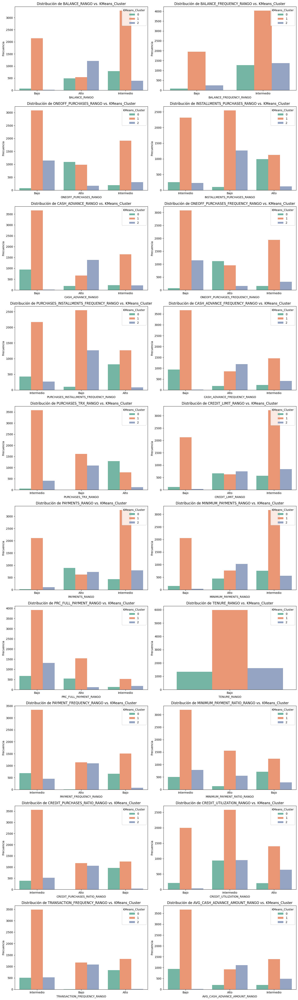

In [38]:
# Obtener las columnas categóricas
categorical_columns = data_scaled.select_dtypes(include=['object']).columns

# Configurar la figura con dos subgráficos por fila
num_columns = 2
num_rows = (len(categorical_columns) + num_columns - 1) // num_columns  # Calcular el número de filas necesarias

fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))

# Aplanar la lista de ejes para un fácil acceso
axes = axes.flatten()

# Crear el diagrama de barras para las variables categóricas
for i, column in enumerate(categorical_columns):
    sns.countplot(x=column, hue='KMeans_Cluster', data=data_scaled, ax=axes[i], palette='Set2')
    axes[i].set_title(f'Distribución de {column} vs. KMeans_Cluster')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frecuencia')
    axes[i].legend(title='KMeans_Cluster', loc='upper right')

# Eliminar subgráficos vacíos si los hay
for j in range(i + 1, num_rows * num_columns):
    fig.delaxes(axes[j])

plt.tight_layout()  # Ajustar el layout para evitar solapamiento
plt.show()

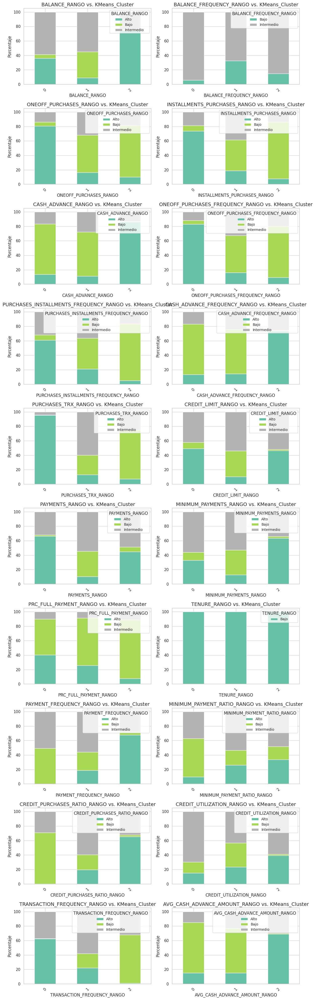

In [39]:
# Configurar el estilo de seaborn
sns.set(style="whitegrid")

# Obtener las columnas categóricas
categorical_columns = x  # Asegúrate de que 'x' contenga las columnas categóricas deseadas

# Número de columnas para los subgráficos
n_cols = 2
n_rows = (len(categorical_columns) + n_cols - 1) // n_cols  # Calcular el número de filas necesarias

# Crear figura y ejes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows), squeeze=False)

# Crear diagrama de barras apiladas
for i, column in enumerate(categorical_columns):
    ax = axes[i // n_cols, i % n_cols]  # Seleccionar el eje correspondiente

    # Calcular conteos y porcentajes
    counts = data_scaled.groupby(['KMeans_Cluster', column]).size().unstack(fill_value=0)
    percentages = counts.div(counts.sum(axis=1), axis=0) * 100  # Calcular porcentajes

    # Crear el gráfico apilado
    percentages.plot(kind='bar', stacked=True, ax=ax, colormap='Set2')

    # Mejorar apariencia
    ax.set_title(f'{column} vs. KMeans_Cluster', fontsize=14)
    ax.set_xlabel(column, fontsize=12)
    ax.set_ylabel('Porcentaje', fontsize=12)
    ax.tick_params(axis='x', rotation=45)  # Rotar etiquetas del eje x para mejor legibilidad
    ax.legend(title=column, loc='upper right', fontsize=10)

# Eliminar ejes vacíos si hay un número impar de gráficos
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()  # Ajustar layout
plt.show()


#10. Interpretacion de los clusters

**Cluster C1**

* Balance Rango: Alto (36.20%) - Intermedio (58.61%)
* Frecuencia de Balance: Intermedio (93.99%)
* Compras Únicas: Alto (80.71%)
* Compras a Plazos: Alto (73.59%)

**Interpretación:**\
El clúster C1 representa a una clientela activa, predominantemente con balances intermedios y altos. Tienen una buena cantidad de recursos disponibles y realizan transacciones regulares, lo que indica un perfil que busca optimizar su flujo de caja.


**Cluster C2**
* Balance Rango: Intermedio (55.03%) - Bajo (35.95%)
* Frecuencia de Balance: Intermedio (67.41%)
* Compras Únicas: Bajo (51.52%)
* Compras a Plazos: Alto (18.77%)

**Interpretación:**\
Este clúster está compuesto principalmente por clientes con balances intermedios y bajos, lo que sugiere una falta de capacidad para realizar compras en efectivo. Su enfoque cauteloso hacia el gasto es evidente, aunque algunos están abiertos a compras a plazos.

**Cluster C3**
* Balance Rango: Alto (74.78%)
* Frecuencia de Balance: Intermedio (84.98%)
* Compras Únicas: Bajo (70.89%)
* Avances de Efectivo: Alto (86.03%)

**Interpretación:**\
El clúster C3 se caracteriza por una clientela financieramente sólida, con balances altos. A pesar de su buena situación financiera, muestran un comportamiento conservador en compras únicas y un uso elevado de avances de efectivo, lo que puede indicar una preferencia por liquidez inmediata.